In [2]:
import pandas as pd
import numpy as np 
import scipy as sp
import os

np.random.seed(42)

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns # sns is an alias pointing to seaborn
sns.set(color_codes=True) #Set aesthetic parameters in one step. Remaps the shorthand color codes (e.g. “b”, “g”, “r”, etc.) to the colors from this palette.
from scipy import stats #Documentation stats package of scipy https://docs.scipy.org/doc/scipy/reference/stats.html#module-scipy.stats

In [4]:
plt.rcParams['axes.labelsize'] = 14  # fontsize of the x any y labels
plt.rcParams['xtick.labelsize'] = 12 # fontsize of the tick labels
plt.rcParams['ytick.labelsize'] = 12 # fontsize of the tick labels

In [5]:
# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "decision_trees"

# Define path of an image
# Function that takes as input fig_id and returns back the image path
def image_path(fig_id):
    return os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id)

# Save image in a specific path
# Function that takes as input fig_id and saves the image in a specific format (i.e., png, 300 dpi)
def save_fig(fig_id, tight_layout=True):
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(image_path(fig_id) + ".png", format='png', dpi=300)
    

In [6]:
df = pd.read_csv("C:/Users/10331/OneDrive/Desktop/HW1_Data.csv")

## EDA

In [6]:
df.head()

,revenue,outcalls,incalls,months,eqpdays,webcap,marryyes,travel,pcown,creditcd,retcalls,churndep
0,83.53,20.00,1.0,31,745,1,0,0,0,0,4,1
1,29.99,0.00,0.0,52,1441,0,0,0,1,1,3,1
2,37.75,2.67,0.0,25,572,0,0,0,1,1,3,1
3,5.25,0.00,0.0,45,1354,0,0,0,0,0,2,1
4,42.71,8.67,0.0,27,224,1,0,0,0,0,3,1


In [7]:
df.shape

(31891, 12)

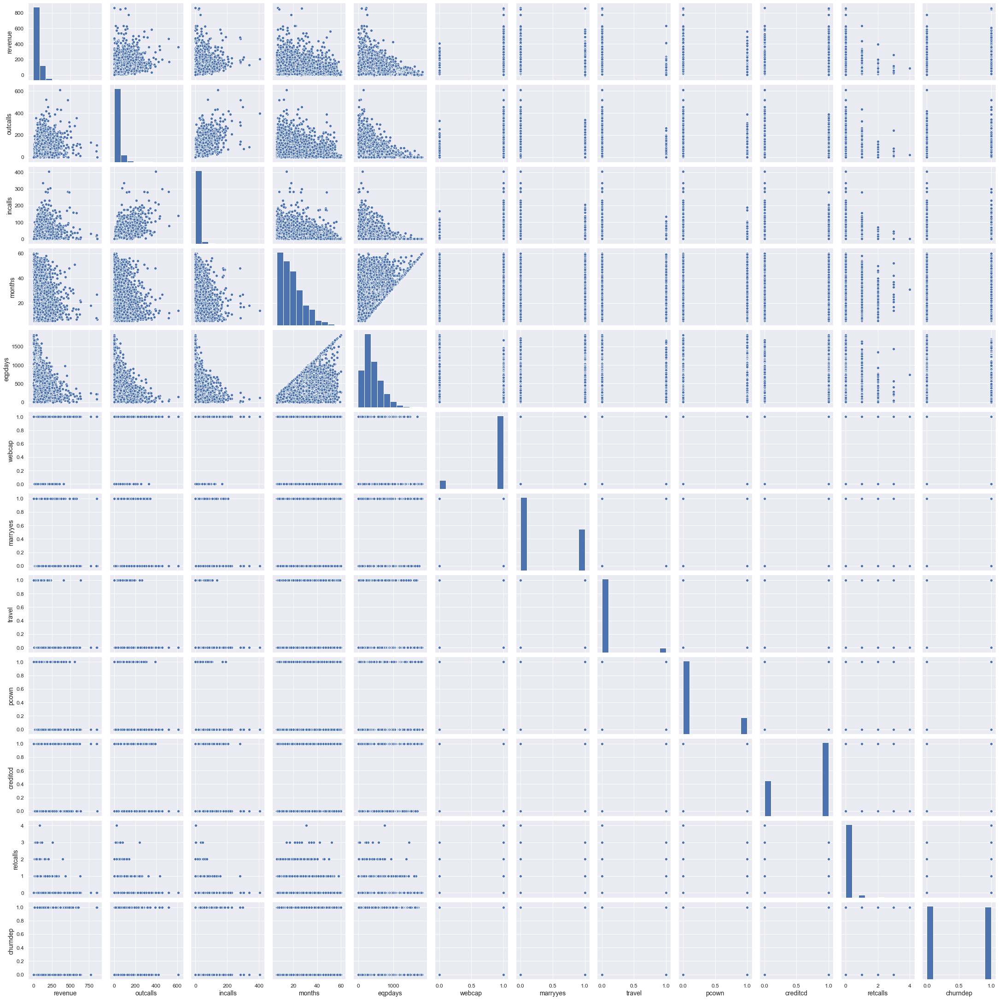

In [8]:
sns.pairplot(df)

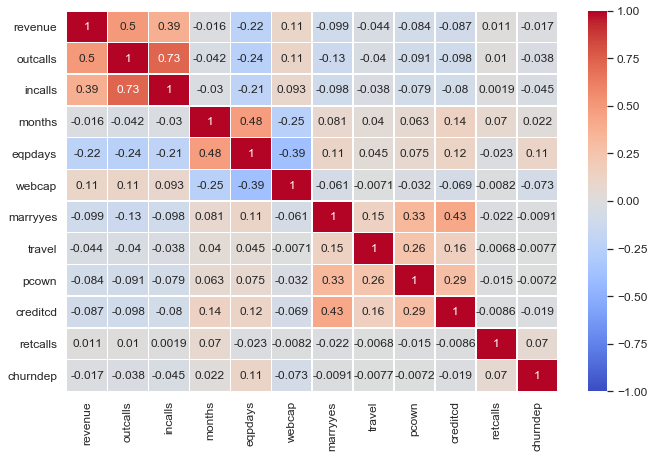

In [9]:
from matplotlib.pyplot import figure
plt.figure(figsize=(11, 7))

corr = df.corr()
sns.heatmap(corr, vmin=-1, vmax=1,cmap="coolwarm", linewidths=.5,annot=True)
plt.show()

In [10]:
df.describe()

,revenue,outcalls,incalls,months,eqpdays,webcap,marryyes,travel,pcown,creditcd,retcalls,churndep
count,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000
mean,58.665179,24.951385,8.065277,18.761908,391.222633,0.894704,0.363175,0.057163,0.184817,0.676931,0.044088,0.497162
std,44.163859,34.790147,16.610589,9.548019,254.998478,0.306939,0.480922,0.232158,0.388155,0.467656,0.224552,0.500000
min,-5.860000,0.000000,0.000000,6.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,33.450000,3.000000,0.000000,11.000000,212.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,48.380000,13.330000,2.000000,17.000000,341.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,71.040000,33.330000,9.000000,24.000000,530.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,861.110000,610.330000,404.000000,60.000000,1812.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000


(100, 405)

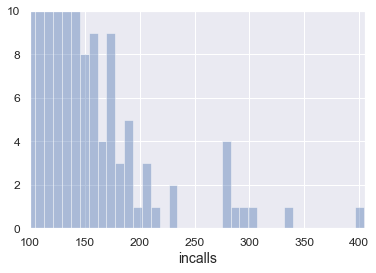

In [7]:
sns.distplot(df["incalls"],kde=False)
plt.ylim(0,10)
plt.xlim(100,405)

In [8]:
df = df[df['incalls']<250]

(80, 870)

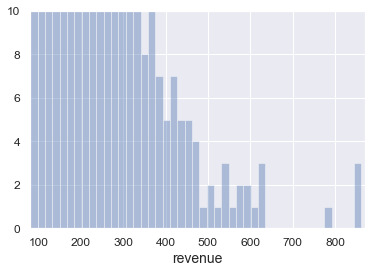

In [9]:
sns.distplot(df["revenue"],kde=False)
plt.ylim(0,10)
plt.xlim(80,870)

In [10]:
df = df[df['revenue']<700]

(35, 620)

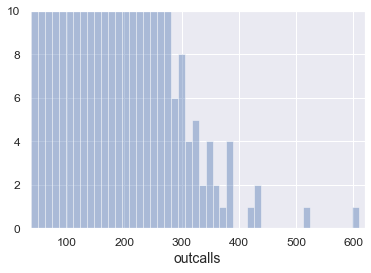

In [11]:
sns.distplot(df["outcalls"],kde=False)
plt.ylim(0,10)
plt.xlim(35,620)

In [12]:
df = df[df['outcalls']<400]

(0, 4)

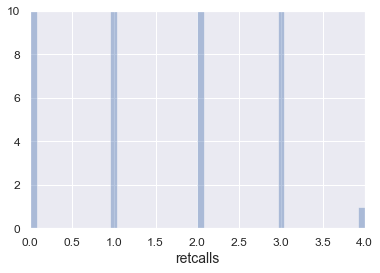

In [13]:
sns.distplot(df["retcalls"],kde=False)
plt.ylim(0,10)
plt.xlim(0,4)

In [14]:
df = df[df['retcalls']<=3]

In [15]:
# split price
churndep = df['churndep'].to_frame()

# delete price from data
del df['churndep']

df.head()

,revenue,outcalls,incalls,months,eqpdays,webcap,marryyes,travel,pcown,creditcd,retcalls
1,29.99,0.00,0.00,52,1441,0,0,0,1,1,3
2,37.75,2.67,0.00,25,572,0,0,0,1,1,3
3,5.25,0.00,0.00,45,1354,0,0,0,0,0,2
4,42.71,8.67,0.00,27,224,1,0,0,0,0,3
5,53.69,15.00,2.33,23,267,1,0,0,0,1,3


## Question A

In [16]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df, churndep, test_size=0.2, random_state=0)

print('train size:', x_train.shape[0])
print('test size:', x_test.shape[0])

train size: 25497
test size: 6375


In [17]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn import tree
import graphviz

In [20]:
if not os.path.exists('./images/decision_trees'):
    os.makedirs('./images/decision_trees')

In [21]:
dt1 = DecisionTreeClassifier(criterion = "entropy", random_state=42)
dt1.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [22]:
os.chdir("./images/decision_trees")

In [17]:
export_graphviz(
        dt1,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

In [18]:
import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

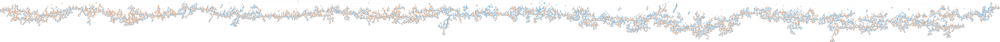

In [19]:
Image(filename="tree.png")

In [23]:
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [24]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() - (cm.max() - cm.min())
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [26]:
from sklearn.model_selection import cross_val_predict
y_pred = cross_val_predict(dt1, x_train, y_train, cv=5)

dt1_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

Confusion matrix, without normalization
[[6854 5933]
 [6005 6705]]


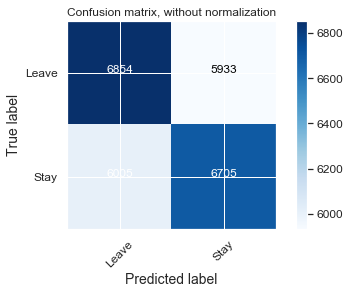

In [27]:
plt.figure()
plot_confusion_matrix(dt1_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

Normalized confusion matrix
[[0.54 0.46]
 [0.47 0.53]]


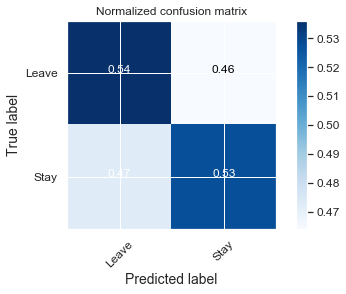

In [28]:
plt.figure()
plot_confusion_matrix(dt1_matrix, classes=["Leave", "Stay"], normalize=True,
                      title='Normalized confusion matrix')

In [29]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score

tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5015099815664588 accrate: 0.5317880534964898 error: 0.4682119465035102 
precision: 0.5305428074062352 recall: 0.5275373721479151 f_measure: 0.5290358213665773


## Question B

### Max_Depth = 10

In [286]:
dt2 = DecisionTreeClassifier(max_depth = 10, criterion = "entropy", random_state=42)
dt2.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

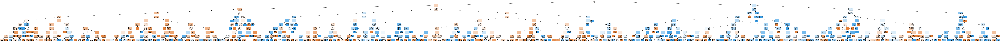

In [222]:
export_graphviz(
        dt2,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

Image(filename="tree.png")

In [287]:
from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt2, x_train, y_train, cv=5)

In [288]:
dt2_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

Confusion matrix, without normalization
[[5895 6910]
 [3664 9043]]


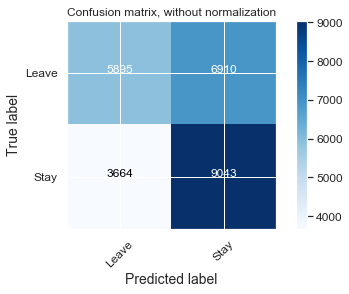

In [289]:
plt.figure()
plot_confusion_matrix(dt2_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [290]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5019206647851991 accrate: 0.5855283788021324 error: 0.4144716211978677 
precision: 0.5668526295994484 recall: 0.7116549933107736 f_measure: 0.6310537334263783


### Max_Depth = 15

In [291]:
dt3 = DecisionTreeClassifier(max_depth = 15, criterion = "entropy", random_state=42)
dt3.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [292]:
from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt3, x_train, y_train, cv=5)

In [293]:
dt3_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

Confusion matrix, without normalization
[[6360 6445]
 [4513 8194]]


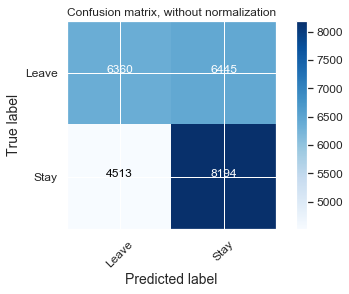

In [294]:
plt.figure()
plot_confusion_matrix(dt3_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [295]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5019206647851991 accrate: 0.5704766384446535 error: 0.4295233615553465 
precision: 0.5597376870004782 recall: 0.6448414259856772 f_measure: 0.599283258977547


### Max_Depth = 5

Confusion matrix, without normalization
[[5533 7272]
 [3069 9638]]


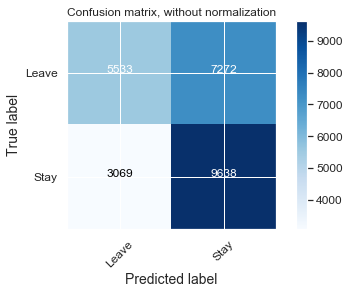

In [305]:
dt4 = DecisionTreeClassifier(max_depth = 5, criterion = "entropy", random_state=42)
dt4.fit(x_train, y_train)

from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt4, x_train, y_train, cv=5)

dt4_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(dt4_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [306]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5019206647851991 accrate: 0.5946613358419567 error: 0.40533866415804326 
precision: 0.5699586043761088 recall: 0.7584795781852522 f_measure: 0.6508424215821994


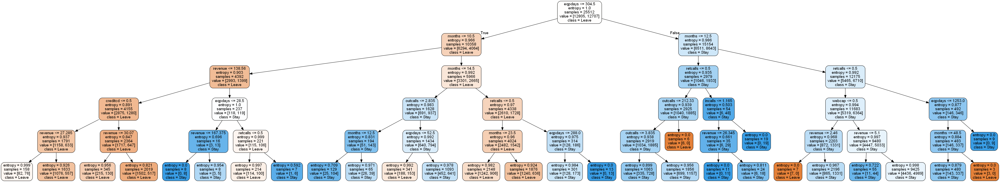

In [313]:
export_graphviz(
        dt4,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

Image(filename="tree.png")

### Max_Depth = 10, Gini

Confusion matrix, without normalization
[[5950 6855]
 [3720 8987]]


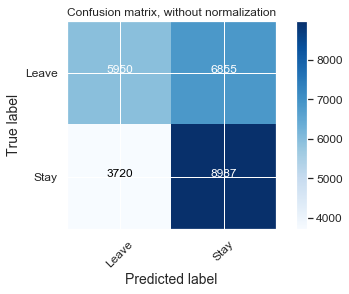

In [322]:
dt5 = DecisionTreeClassifier(max_depth = 10, criterion = "gini", random_state=42)
dt5.fit(x_train, y_train)

from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt5, x_train, y_train, cv=5)

dt5_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(dt5_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [323]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5019206647851991 accrate: 0.5854891815616181 error: 0.41451081843838194 
precision: 0.5672894836510541 recall: 0.7072479735578815 f_measure: 0.6295842236155382


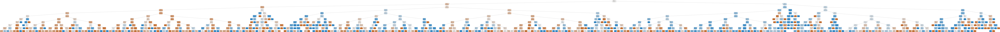

In [324]:
export_graphviz(
        dt5,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

Image(filename="tree.png")

### Max_Depth = 5, Gini

Confusion matrix, without normalization
[[5618 7187]
 [3138 9569]]


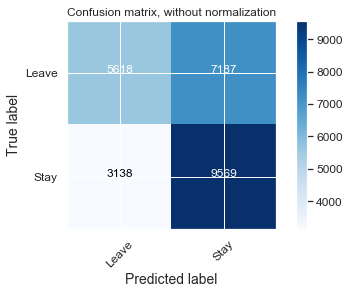

In [309]:
dt6 = DecisionTreeClassifier(max_depth = 5, criterion = "gini", random_state=42)
dt6.fit(x_train, y_train)

from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt6, x_train, y_train, cv=5)

dt6_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(dt6_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [310]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5019206647851991 accrate: 0.595288491690185 error: 0.404711508309815 
precision: 0.5710790164717117 recall: 0.7530495002754387 f_measure: 0.649560465668805


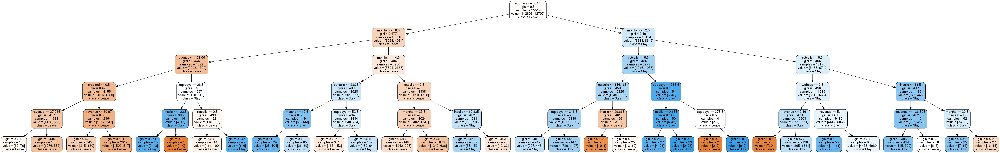

In [311]:
export_graphviz(
        dt6,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

Image(filename="tree.png")

# Question 3 Best Model

### Max_Depth = 4, gini, Leaf

Confusion matrix, without normalization
[[5501 7304]
 [3028 9679]]


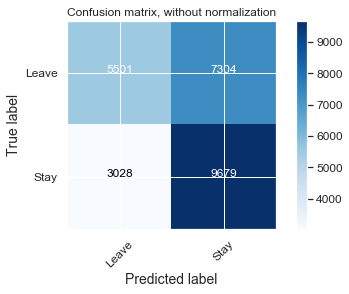

In [581]:
dt7 = DecisionTreeClassifier(max_depth = 4, criterion = "gini", random_state=42, min_samples_leaf = 2)

#, min_samples_leaf = 2, max_leaf_nodes = 6)

#,min_samples_split

dt7.fit(x_train, y_train)

from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt7, x_train, y_train, cv=5)

dt7_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(dt7_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [582]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5019206647851991 accrate: 0.5950141110065852 error: 0.40498588899341487 
precision: 0.5699228640405111 recall: 0.7617061462186197 f_measure: 0.652004041764904


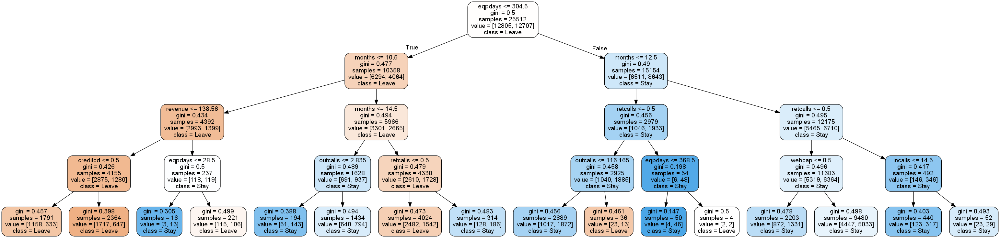

In [583]:
export_graphviz(
        dt7,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

Image(filename="tree.png")

### Max_Depth = 5, Gini, Leaf = 2, nodes = 11 

Confusion matrix, without normalization
[[5401 7386]
 [2893 9817]]


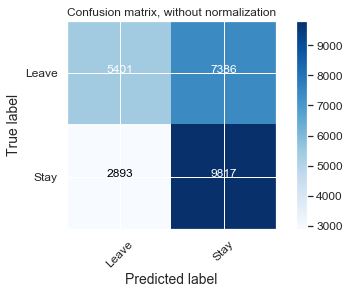

In [30]:
dt8 = DecisionTreeClassifier(max_depth = 5, criterion = "gini", random_state=42, min_samples_leaf = 2, max_leaf_nodes = 11)
dt8.fit(x_train, y_train)

from sklearn.model_selection import cross_val_predict

y_pred = cross_val_predict(dt8, x_train, y_train, cv=5)

dt8_matrix = confusion_matrix(y_train, y_pred)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(dt8_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [31]:
tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_train, y_pred)
recall = recall_score(y_train, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.5015099815664588 accrate: 0.5968545319057144 error: 0.4031454680942856 
precision: 0.5706562808812417 recall: 0.772383949645948 f_measure: 0.6563701400728781


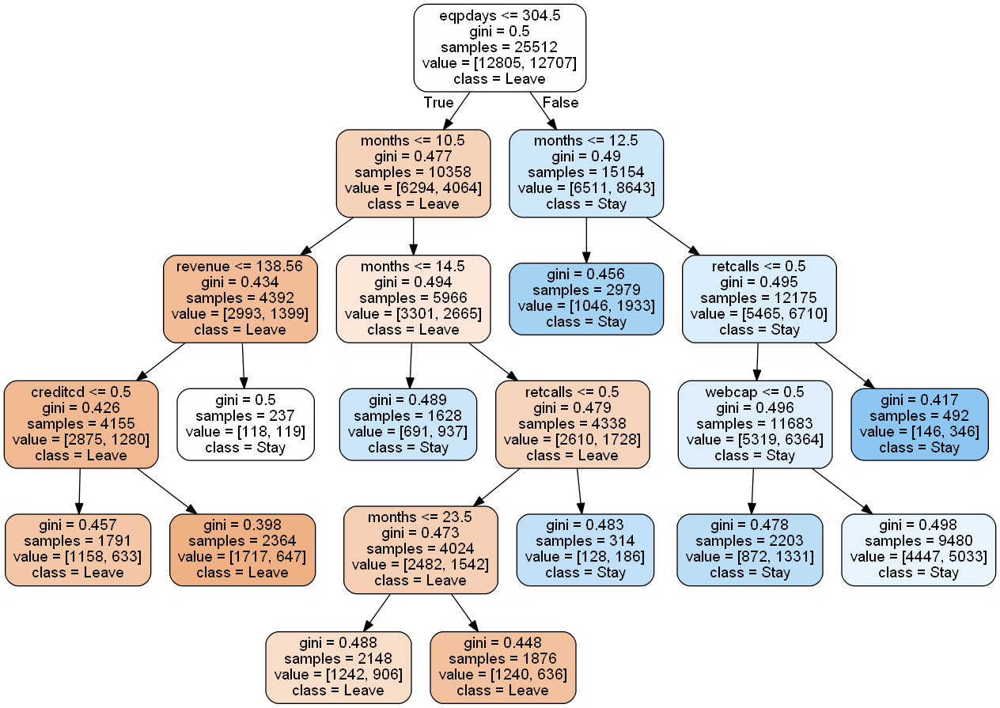

In [649]:
export_graphviz(
        dt8,
        out_file= "tree.dot",
        feature_names=list(df.columns),
        class_names = ["Leave", "Stay"],
        rounded=True,
        filled=True
    )

import pydot
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

Image(filename="tree.png")

# Final Evaluation

Confusion matrix, without normalization
[[1378 1862]
 [ 811 2324]]


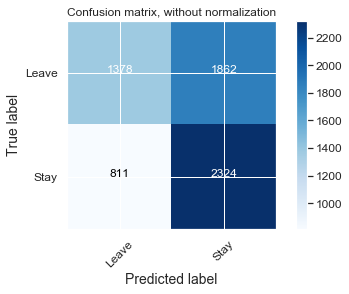

In [32]:
y_pred = cross_val_predict(dt8, x_test, y_test, cv=5)

dt8_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(dt8_matrix, classes=["Leave", "Stay"],
                      title='Confusion matrix, without normalization')

In [33]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

error = (fp+fn)/(tn+fp+fn+tp)
accrate = (tn+tp)/(tn+fp+fn+tp)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f_measure = 2* (precision * recall) / (precision + recall)

if (tp + fn)>(fp + tn):
    naive = (tp + fn)/(tn+fp+fn+tp)
else:
    naive = (fp + tn)/(tn+fp+fn+tp)

print( "naive:", naive,"accrate:", accrate,"error:", error,"\nprecision:", 
      precision,"recall:", recall,"f_measure:", f_measure)

naive: 0.508235294117647 accrate: 0.5807058823529412 error: 0.4192941176470588 
precision: 0.5551839464882943 recall: 0.7413078149920255 f_measure: 0.6348859445430952
